GAN adapted from [Deep Learning with Python, second edition](https://colab.research.google.com/github/fchollet/deep-learning-with-python-notebooks/blob/master/chapter12_part05_gans.ipynb#scrollTo=QNwmm9K0lJjZ) 

DC-GAN adapted from [Tensorflow tutorial](https://www.tensorflow.org/tutorials/generative/dcgan)

Other DC-GAN adapted from [Image Generator on the simpsons dataset](https://www.kaggle.com/code/greg115/image-generator-dcgan-the-simpsons-dataset)

GauGAN adapted from [GauGAN for conditional image generation](https://colab.research.google.com/github/keras-team/keras-io/blob/master/examples/generative/ipynb/gaugan.ipynb#scrollTo=OaKgpY9Bn9fM)

StyleGAN adapted from [Official Tensorflow implementation](https://github.com/NVlabs/stylegan)

In [ ]:
!pip install git+https://github.com/tensorflow/docs
!pip install tensorflow_addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-nxf7ot8w
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-nxf7ot8w
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import tensorflow as tf
from tensorflow import keras
import tensorflow_addons as tfa
from tensorflow.keras import layers
import tensorflow_docs.vis.embed as embed
from tensorflow.keras.models import Sequential
from tensorflow_addons.layers import InstanceNormalization

import os
import time
import random
import math
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

import glob
from glob import glob
from enum import Enum
from functools import partial
import imageio
import PIL
from PIL import Image, ImageOps
from IPython import display

import gdown
from zipfile import ZipFile
from google.colab import files, drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# creating a dataset from a directory of images
dataset = keras.utils.image_dataset_from_directory(
    "drive/My Drive/opencampus/GANart for NFTs/datasets/camelia otero/",
    label_mode=None,
    image_size=(64, 64),
    batch_size=32,
    smart_resize=True)

Found 1000 files belonging to 1 classes.


In [ ]:
# rescaling the images
dataset = dataset.map(lambda x: x / 255.)

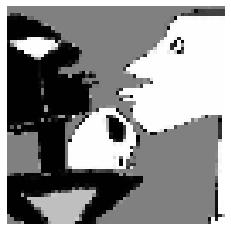

In [ ]:
# displaying the first image
for x in dataset:
    plt.axis("off")
    plt.imshow((x.numpy() * 255).astype("int32")[0])
    break

# Simple GAN

In [ ]:
# create the GAN discriminator network
discriminator = keras.Sequential(
    [
        keras.Input(shape=(64, 64, 3)),
        layers.Conv2D(64, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Flatten(),
        layers.Dropout(0.2),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator",
)

discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 128)         262272    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)            

In [ ]:
# create the GAN generator network
latent_dim = 128

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(8 * 8 * 128),
        layers.Reshape((8, 8, 128)),
        layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2DTranspose(256, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2DTranspose(512, kernel_size=4, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(3, kernel_size=5, padding="same", activation="sigmoid"),
    ],
    name="generator",
)

generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 8192)              1056768   
                                                                 
 reshape (Reshape)           (None, 8, 8, 128)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 128)      262272    
 nspose)                                                         
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 32, 32, 256)      524544    
 ranspose)                                                       
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 32, 32, 256)       0 

In [ ]:
# the adversarial model
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim))
        generated_images = self.generator(random_latent_vectors)
        combined_images = tf.concat([generated_images, real_images], axis=0)
        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))],
            axis=0
        )
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim))

        misleading_labels = tf.zeros((batch_size, 1))

        with tf.GradientTape() as tape:
            predictions = self.discriminator(
                self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {"d_loss": self.d_loss_metric.result(),
                "g_loss": self.g_loss_metric.result()}

In [ ]:
# create a callback that samples generated images during training
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 255
        generated_images.numpy()
        for i in range(self.num_img):
            img = keras.utils.array_to_img(generated_images[i])
            img.save(f"generated_img_{epoch:03d}_{i}.png")

In [ ]:
# compiling and training the gan
epochs = 50

gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)
gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
    g_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

gan_history = gan.fit(
    dataset, epochs=epochs, callbacks=[GANMonitor(num_img=10, latent_dim=latent_dim)]
)

Epoch 1/50
32/32 [==============================] - 809s 25s/step - d_loss: 0.5598 - g_loss: 0.9886
Epoch 2/50
32/32 [==============================] - 807s 25s/step - d_loss: 0.3461 - g_loss: 0.9801
Epoch 3/50
32/32 [==============================] - 810s 25s/step - d_loss: 0.2150 - g_loss: 1.4910
Epoch 4/50
32/32 [==============================] - 804s 25s/step - d_loss: 0.0705 - g_loss: 3.4296
Epoch 5/50
32/32 [==============================] - 807s 25s/step - d_loss: 0.0329 - g_loss: 5.2988
Epoch 6/50
32/32 [==============================] - 809s 25s/step - d_loss: 0.0084 - g_loss: 7.0949
Epoch 7/50
32/32 [==============================] - 804s 25s/step - d_loss: -0.0229 - g_loss: 10.3076
Epoch 8/50
32/32 [==============================] - 800s 25s/step - d_loss: 0.2940 - g_loss: 9.2464
Epoch 9/50
32/32 [==============================] - 801s 25s/step - d_loss: 0.3529 - g_loss: 6.7525
Epoch 10/50
32/32 [==============================] - 801s 25s/step - d_loss: 1.4657 - g_loss: 3.50

In [ ]:
plt.suptitle('Loss')
plt.plot(gan_history.history['d_loss'], label='d_loss')
plt.plot(gan_history.history['g_loss'], label='g_loss')
plt.legend()
plt.show()

In [ ]:
imgs = generator.predict(tf.random.normal((16, 128, 1)))

In [ ]:
fig, ax = plt.subplots(ncols=4, nrows=4, figsize=(10,10))
for r in range(4): 
    for c in range(4): 
        ax[r][c].imshow(imgs[(r+1)*(c+1)-1])

In [ ]:
# save the model
generator.save('gan_generator.h5')
files.download('gan_generator.h5')

discriminator.save('gan_discriminator.h5')
files.download('gan_discriminator.h5')

In [ ]:
# save an image
gan_img = generator.predict(tf.random.normal((1, 128, 1)))
gan_img.save('gan_img.png')
files.download('gan_img.png')

In [ ]:
# produce and save a series of 1k images
10k = generator.predict(tf.random.normal((10000, 128, 1)))

# dcGAN

We can use the same dataset than the GAN

In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(4*4*1024, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((4, 4, 1024)))
    assert model.output_shape == (None, 4, 4, 1024)  # Note: None is the batch size

    model.add(layers.Conv2DTranspose(512, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 512)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 256)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(128, (5,5), strides = (2,2), padding = "same", use_bias = False))
    assert model.output_shape == (None, 32, 32, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 64, 64, 3)

    return model

generator = make_generator_model()
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16384)             1638400   
                                                                 
 batch_normalization (BatchN  (None, 16384)            65536     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16384)             0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 1024)        0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 512)        13107200  
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 512)        2

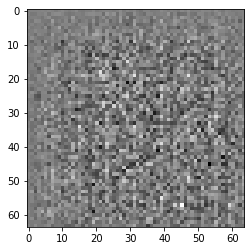

In [ ]:
# generating an image
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray') # gray pixels

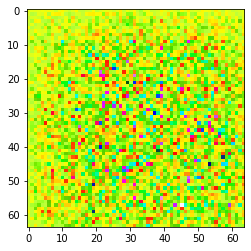

In [ ]:
# colorize it with another cmap of your choice
plt.imshow(generated_image[0, :, :, 0], cmap='gist_ncar') # colored pixels

##### this is just a colorization of the generated image, not a generated colered image. check all color map options at https://matplotlib.org/stable/tutorials/colors/colormaps.html

In [ ]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[64, 64, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 64)        4864      
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       204928    
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 128)       0         
                                                                 
 flatten (Flatten)           (None, 32768)            

In [ ]:
# discriminate generated image
decision = discriminator(generated_image)
print(decision)

tf.Tensor([[0.00141443]], shape=(1, 1), dtype=float32)


In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

# generator loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)

# save checkpoints
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
# define the training loop
EPOCHS = 50
batch_size = 4
noise_dim = 100
num_examples_to_generate = 16

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [ ]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [ ]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    # Produce images for the GIF as you go
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    # Save the model every 15 epochs
    if (epoch + 1) % 15 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  # Generate after the final epoch
  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

In [ ]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(10, 10))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0] * 256, cmap='gist_ncar') #change color here
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

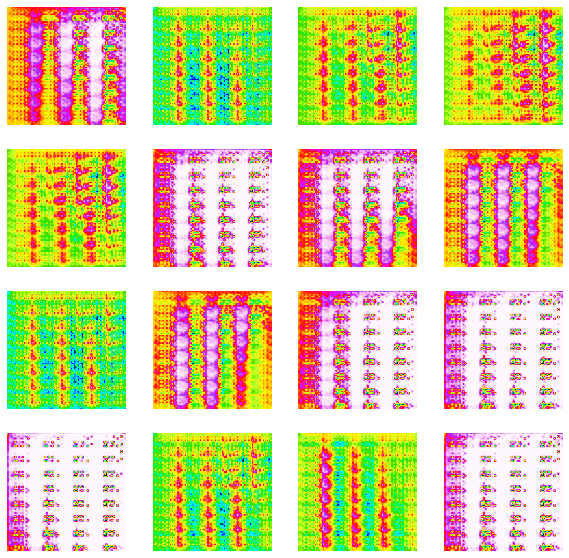

Time for epoch 4 is 144.68847846984863 sec


KeyboardInterrupt: ignored

In [ ]:
#tf.config.run_functions_eagerly(True)
dcgan_history = train(dataset, EPOCHS)

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [ ]:
def plot_losses(G_losses, D_losses, all_gl, all_dl, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH {}".format(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    ymax = plt.ylim()[1]
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.plot(np.arange(len(all_gl)),all_gl,label='G')
    plt.plot(np.arange(len(all_dl)),all_dl,label='D')
    plt.legend()
    #plt.ylim((0,np.min([1.1*np.max(all_gl),2*ymax])))
    plt.title('All Time Loss')
    plt.show()

In [ ]:
plot_losses(gen_loss, disc_loss, )

TypeError: ignored

### generate a gif

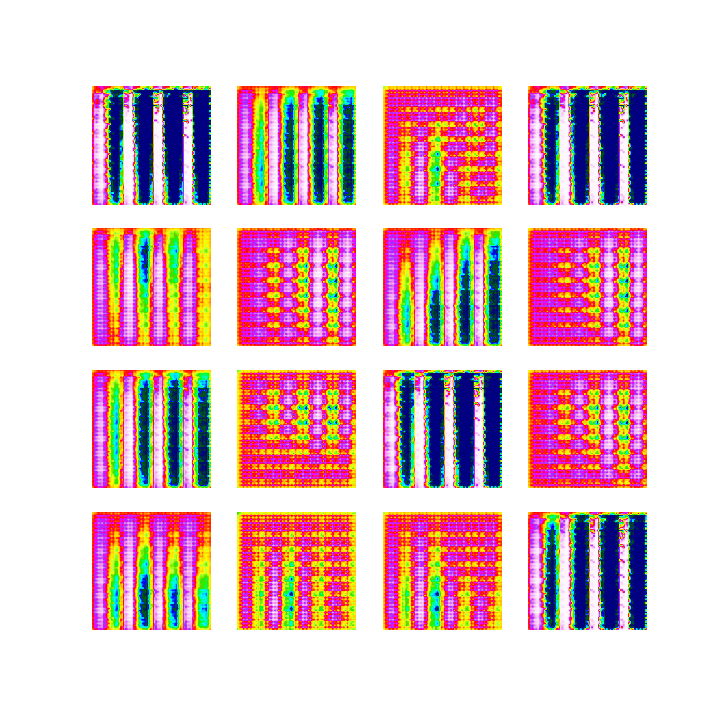

In [ ]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

display_image(EPOCHS)

In [ ]:
# save an image
dcgan_img = display_image(50) #change number to the epoch with lower loss
dcgan_img.save('dcgan_img.png')
files.download('dcgan_img.png')

In [ ]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  last = -1
  for i,filename in enumerate(filenames):
    frame = 2*(i**0.5)
    if round(frame) > round(last):
      last = frame
    else:
      continue
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [ ]:
# display the gif
embed.embed_file(anim_file)

In [ ]:
# download the gif
try:
  from google.colab import files
except ImportError:
   pass
else:
  files.download(anim_file)

In [ ]:
# save the model
generator.save('dc_generator.h5')
files.download('dc_generator.h5')

discriminator.save('dc_discriminator.h5')
files.download('dc_discriminator.h5')

### the previous dcGAN works on 1 dimensional images, thus it is shades of grey not colored. Try to adapt it to generate colored images

# other dcgan

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

Instructions for updating:
non-resource variables are not supported in the long term


In [ ]:
def generator(z, output_channel_dim, training):
    with tf.variable_scope("generator", reuse= not training):
        
        # 8x8x1024
        fully_connected = tf.layers.dense(z, 8*8*1024)
        fully_connected = tf.reshape(fully_connected, (-1, 8, 8, 1024))
        fully_connected = tf.nn.leaky_relu(fully_connected)

        # 8x8x1024 -> 16x16x512
        trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                                 filters=512,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv1")
        batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv1")
        trans_conv1_out = tf.nn.leaky_relu(batch_trans_conv1,
                                           name="trans_conv1_out")
        
        # 16x16x512 -> 32x32x256
        trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out,
                                                 filters=256,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv2")
        batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv2")
        trans_conv2_out = tf.nn.leaky_relu(batch_trans_conv2,
                                           name="trans_conv2_out")
        
        # 32x32x256 -> 64x64x128
        trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out,
                                                 filters=128,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv3")
        batch_trans_conv3 = tf.layers.batch_normalization(inputs = trans_conv3,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv3")
        trans_conv3_out = tf.nn.leaky_relu(batch_trans_conv3,
                                           name="trans_conv3_out")
        
        # 64x64x128 -> 128x128x64
        trans_conv4 = tf.layers.conv2d_transpose(inputs=trans_conv3_out,
                                                 filters=64,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv4")
        batch_trans_conv4 = tf.layers.batch_normalization(inputs = trans_conv4,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv4")
        trans_conv4_out = tf.nn.leaky_relu(batch_trans_conv4,
                                           name="trans_conv4_out")
        
        # 128x128x64 -> 128x128x3
        logits = tf.layers.conv2d_transpose(inputs=trans_conv4_out,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding="SAME",
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name="logits")
        out = tf.tanh(logits, name="out")
        return out

In [ ]:
def discriminator(x, reuse):
    with tf.variable_scope("discriminator", reuse=reuse): 
        
        # 128*128*3 -> 64x64x64 
        conv1 = tf.layers.conv2d(inputs=x,
                                 filters=64,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv1')
        batch_norm1 = tf.layers.batch_normalization(conv1,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm1')
        conv1_out = tf.nn.leaky_relu(batch_norm1,
                                     name="conv1_out")
        
        # 64x64x64-> 32x32x128 
        conv2 = tf.layers.conv2d(inputs=conv1_out,
                                 filters=128,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv2')
        batch_norm2 = tf.layers.batch_normalization(conv2,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm2')
        conv2_out = tf.nn.leaky_relu(batch_norm2,
                                     name="conv2_out")
        
        # 32x32x128 -> 16x16x256  
        conv3 = tf.layers.conv2d(inputs=conv2_out,
                                 filters=256,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv3')
        batch_norm3 = tf.layers.batch_normalization(conv3,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm3')
        conv3_out = tf.nn.leaky_relu(batch_norm3,
                                     name="conv3_out")
        
        # 16x16x256 -> 16x16x512
        conv4 = tf.layers.conv2d(inputs=conv3_out,
                                 filters=512,
                                 kernel_size=[5, 5],
                                 strides=[1, 1],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv4')
        batch_norm4 = tf.layers.batch_normalization(conv4,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm4')
        conv4_out = tf.nn.leaky_relu(batch_norm4,
                                     name="conv4_out")
        
        # 16x16x512 -> 8x8x1024
        conv5 = tf.layers.conv2d(inputs=conv4_out,
                                filters=1024,
                                kernel_size=[5, 5],
                                strides=[2, 2],
                                padding="SAME",
                                kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                name='conv5')
        batch_norm5 = tf.layers.batch_normalization(conv5,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm5')
        conv5_out = tf.nn.leaky_relu(batch_norm5,
                                     name="conv5_out")

        flatten = tf.reshape(conv5_out, (-1, 8*8*1024))
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

In [ ]:
def model_loss(input_real, input_z, output_channel_dim):
    g_model = generator(input_z, output_channel_dim, True)

    noisy_input_real = input_real + tf.random_normal(shape=tf.shape(input_real),
                                                     mean=0.0,
                                                     stddev=random.uniform(0.0, 0.1),
                                                     dtype=tf.float32)
    
    d_model_real, d_logits_real = discriminator(noisy_input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real)*random.uniform(0.9, 1.0)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_model_fake)))
    d_loss = tf.reduce_mean(0.5 * (d_loss_real + d_loss_fake))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                    labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

In [ ]:
def model_optimizers(d_loss, g_loss):
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    gen_updates = [op for op in update_ops if op.name.startswith('generator')]
    
    with tf.control_dependencies(gen_updates):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=LR_D, beta1=BETA1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=LR_G, beta1=BETA1).minimize(g_loss, var_list=g_vars)  
    return d_train_opt, g_train_opt

In [ ]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate_G = tf.placeholder(tf.float32, name="lr_g")
    learning_rate_D = tf.placeholder(tf.float32, name="lr_d")
    return inputs_real, inputs_z, learning_rate_G, learning_rate_D

In [ ]:
def show_samples(sample_images, name, epoch):
    figure, axes = plt.subplots(1, len(sample_images), figsize = (IMAGE_SIZE, IMAGE_SIZE))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample_images[index]
        axis.imshow(image_array)
        image = Image.fromarray(image_array)
        image.save(name+"_"+str(epoch)+"_"+str(index)+".png") 
    plt.savefig(name+"_"+str(epoch)+".png", bbox_inches='tight', pad_inches=0)
    plt.show()
    plt.close()

In [ ]:
def test(sess, input_z, out_channel_dim, epoch):
    example_z = np.random.uniform(-1, 1, size=[SAMPLES_TO_SHOW, input_z.get_shape().as_list()[-1]])
    samples = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
    sample_images = [((sample + 1.0) * 127.5).astype(np.uint8) for sample in samples]
    show_samples(sample_images, OUTPUT_DIR + "samples", epoch)

In [ ]:
def summarize_epoch(epoch, duration, sess, d_losses, g_losses, input_z, data_shape):
    minibatch_size = int(data_shape[0]//BATCH_SIZE)
    print("Epoch {}/{}".format(epoch, EPOCHS),
          "\nDuration: {:.5f}".format(duration),
          "\nD Loss: {:.5f}".format(np.mean(d_losses[-minibatch_size:])),
          "\nG Loss: {:.5f}".format(np.mean(g_losses[-minibatch_size:])))
    fig, ax = plt.subplots()
    plt.plot(d_losses, label='Discriminator', alpha=0.6)
    plt.plot(g_losses, label='Generator', alpha=0.6)
    plt.title("Losses")
    plt.legend()
    plt.savefig(OUTPUT_DIR + "losses_" + str(epoch) + ".png")
    plt.show()
    plt.close()
    test(sess, input_z, data_shape[3], epoch)

In [ ]:
def get_batches(data):
    batches = []
    for i in range(int(data.shape[0]//BATCH_SIZE)):
        batch = data[i * BATCH_SIZE:(i + 1) * BATCH_SIZE]
        augmented_images = []
        for img in batch:
            image = Image.fromarray(img)
            if random.choice([True, False]):
                image = image.transpose(Image.FLIP_LEFT_RIGHT)
            augmented_images.append(np.asarray(image))
        batch = np.asarray(augmented_images)
        normalized_batch = (batch / 127.5) - 1.0
        batches.append(normalized_batch)
    return batches

In [ ]:
def train(get_batches, data_shape, checkpoint_to_load=None):
    input_images, input_z, lr_G, lr_D = model_inputs(data_shape[1:], NOISE_SIZE)
    d_loss, g_loss = model_loss(input_images, input_z, data_shape[3])
    d_opt, g_opt = model_optimizers(d_loss, g_loss)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        epoch = 0
        iteration = 0
        d_losses = []
        g_losses = []
        
        for epoch in range(EPOCHS):        
            epoch += 1
            start_time = time.time()

            for batch_images in get_batches:
                iteration += 1
                batch_z = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_SIZE))
                _ = sess.run(d_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_D: LR_D})
                _ = sess.run(g_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_G: LR_G})
                d_losses.append(d_loss.eval({input_z: batch_z, input_images: batch_images}))
                g_losses.append(g_loss.eval({input_z: batch_z}))

            summarize_epoch(epoch, time.time()-start_time, sess, d_losses, g_losses, input_z, data_shape)

In [ ]:
# Paths
INPUT_DATA_DIR = "drive/My Drive/opencampus/GANart for NFTs/datasets/camelia otero/"
# OUTPUT_DIR = './{date:%Y-%m-%d_%H:%M:%S}/'.format(date=datetime.datetime.now())
# if not os.path.exists(OUTPUT_DIR):
#     os.makedirs(OUTPUT_DIR)
OUTPUT_DIR = ""

In [ ]:
# Hyperparameters
IMAGE_SIZE = 64
NOISE_SIZE = 100
LR_D = 0.00004
LR_G = 0.0004
BATCH_SIZE = 64
EPOCHS = 100 # For better results increase this value 
BETA1 = 0.5
WEIGHT_INIT_STDDEV = 0.02
EPSILON = 0.00005
SAMPLES_TO_SHOW = 5

Start!
Input: (1000, 64, 64, 3)


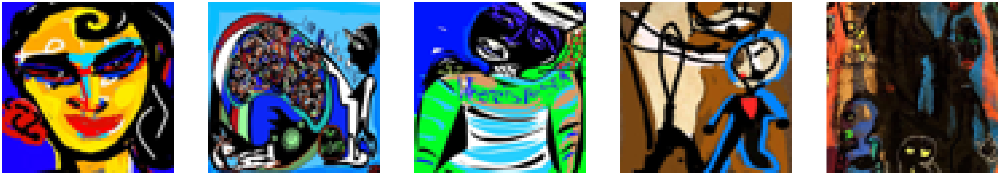

Instructions for updating:
Colocations handled automatically by placer.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  """
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:261: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: `tf.layers.conv2d_transpose` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2DTranspose` instead.
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/convolutional.py:1736: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: `tf.laye

Epoch 1/100 
Duration: 1861.98022 
D Loss: 5.92903 
G Loss: 0.00021


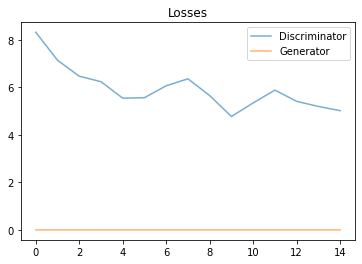

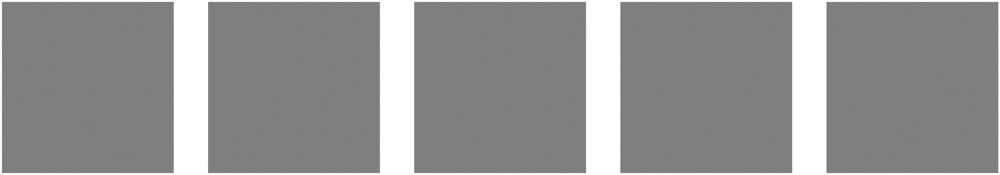

Epoch 2/100 
Duration: 1862.91110 
D Loss: 2.26228 
G Loss: 0.25491


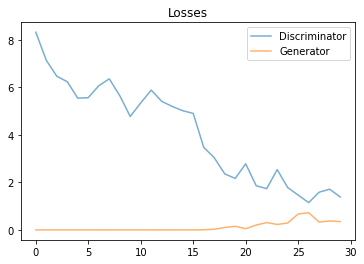

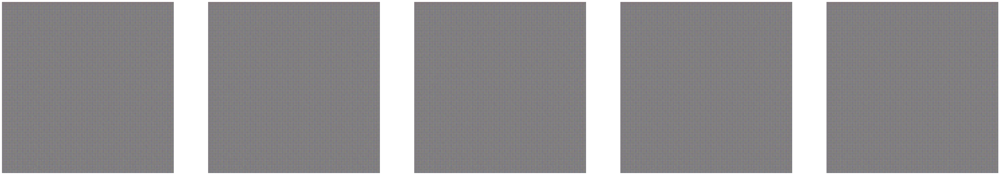

Epoch 3/100 
Duration: 1835.91811 
D Loss: 0.66579 
G Loss: 0.96770


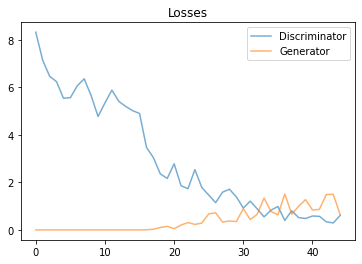

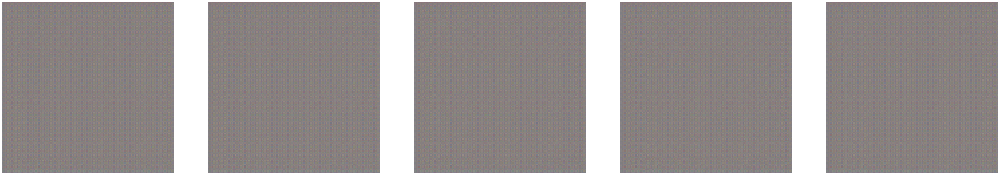

Epoch 4/100 
Duration: 1826.34857 
D Loss: 0.27585 
G Loss: 1.66222


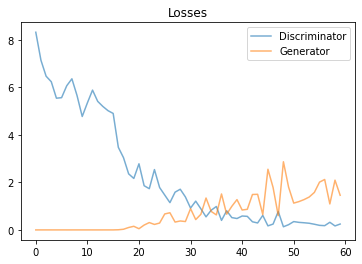

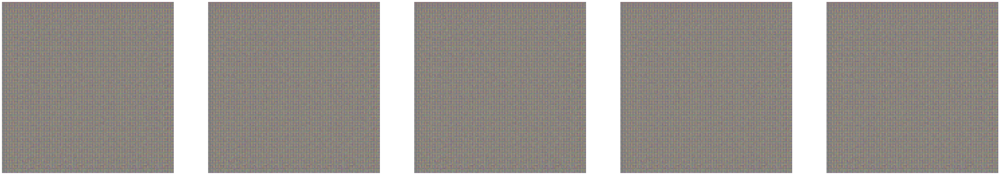

Epoch 5/100 
Duration: 1863.67990 
D Loss: 0.17988 
G Loss: 2.17280


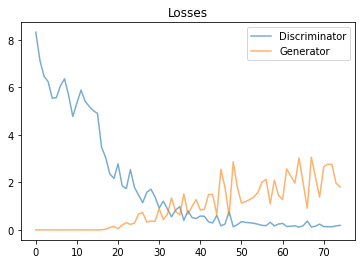

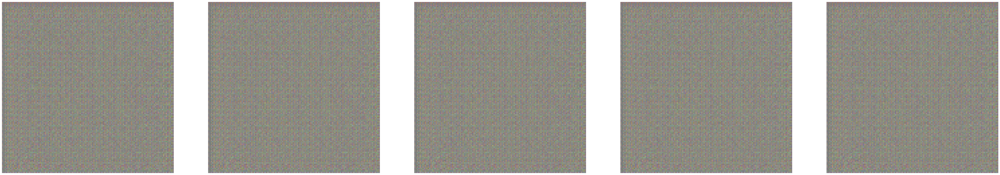

Epoch 6/100 
Duration: 1827.18634 
D Loss: 0.14178 
G Loss: 2.59427


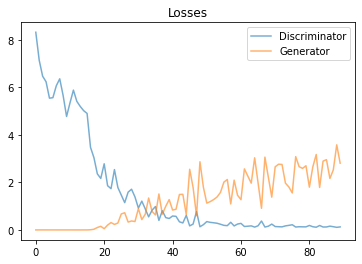

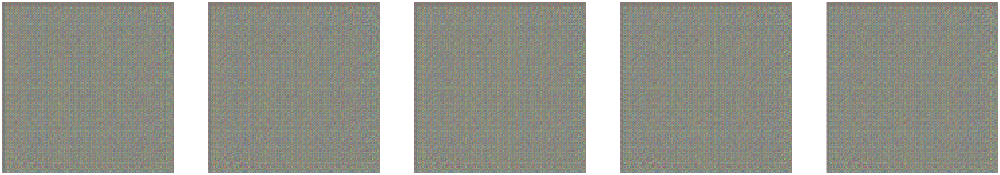

Epoch 7/100 
Duration: 1911.12421 
D Loss: 0.12316 
G Loss: 2.93614


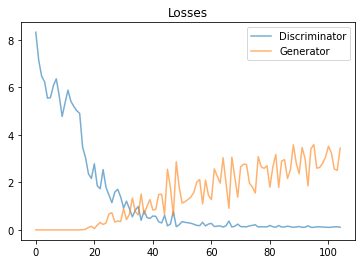

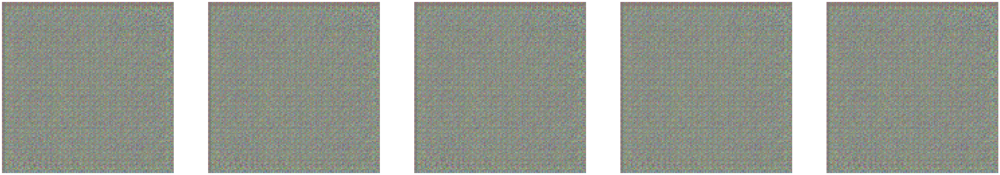

Epoch 8/100 
Duration: 1882.89936 
D Loss: 0.10802 
G Loss: 3.54200


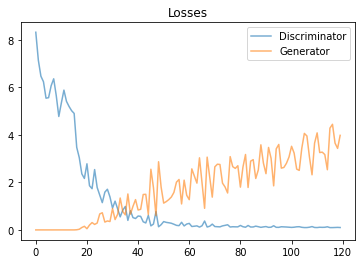

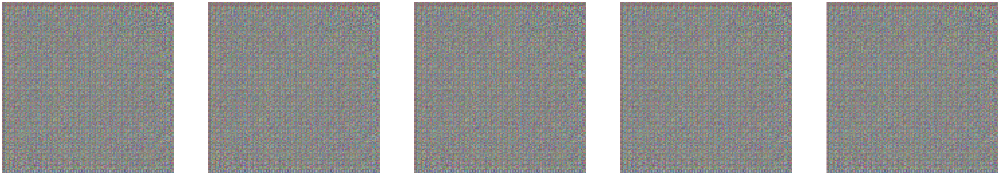

Epoch 9/100 
Duration: 1830.44745 
D Loss: 0.10354 
G Loss: 3.81564


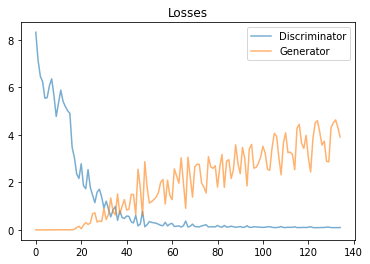

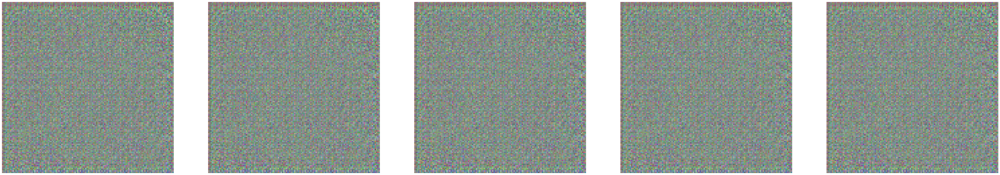

Epoch 10/100 
Duration: 1887.41562 
D Loss: 0.09977 
G Loss: 3.85361


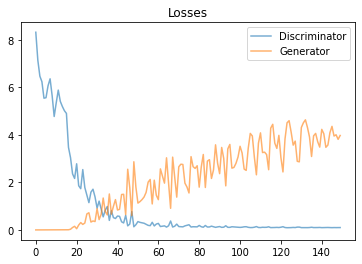

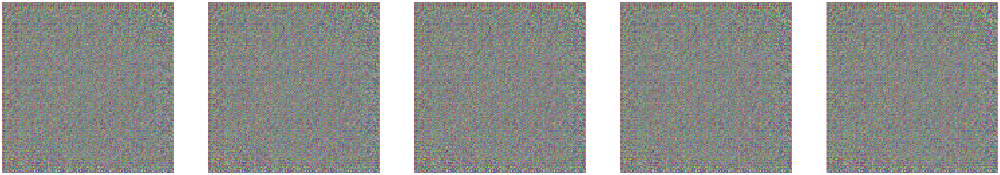

In [ ]:
# Training
print("Start!")
input_images = np.asarray([np.asarray(Image.open(file).resize((IMAGE_SIZE, IMAGE_SIZE))) for file in glob(INPUT_DATA_DIR + '*')])
print ("Input: " + str(input_images.shape))

np.random.shuffle(input_images)

sample_images = random.sample(list(input_images), SAMPLES_TO_SHOW)
show_samples(sample_images, OUTPUT_DIR + "inputs", 0)

with tf.Graph().as_default():
    train(get_batches(input_images), input_images.shape)

# GauGAN

In [ ]:
PATH = "drive/My Drive/opencampus/GANart for NFTs/datasets/camelia otero/"
SPLIT = 0.2

files = glob(PATH + "*.jpeg")
np.random.shuffle(files)

split_index = int(len(files) * (1 - SPLIT))
train_files = files[:split_index]
val_files = files[split_index:]

print(f"Total samples: {len(files)}.")
print(f"Total training samples: {len(train_files)}.")
print(f"Total validation samples: {len(val_files)}.")

Total samples: 1000.
Total training samples: 800.
Total validation samples: 200.


In [ ]:
BATCH_SIZE = 4
IMG_HEIGHT = IMG_WIDTH = 256
NUM_CLASSES = 12
AUTOTUNE = tf.data.AUTOTUNE


def load(image_files, batch_size, is_train=True):
    def _random_crop(
        segmentation_map, image, labels, crop_size=(IMG_HEIGHT, IMG_WIDTH),
    ):
        crop_size = tf.convert_to_tensor(crop_size)
        image_shape = tf.shape(image)[:2]
        margins = image_shape - crop_size
        y1 = tf.random.uniform(shape=(), maxval=margins[0], dtype=tf.int32)
        x1 = tf.random.uniform(shape=(), maxval=margins[1], dtype=tf.int32)
        y2 = y1 + crop_size[0]
        x2 = x1 + crop_size[1]

        cropped_images = []
        images = [segmentation_map, image, labels]
        for img in images:
            cropped_images.append(img[y1:y2, x1:x2])
        return cropped_images

    def _load_data_tf(image_file, segmentation_map_file, label_file):
        image = tf.image.decode_image(tf.io.read_file(image_file), channels=3)
        segmentation_map = tf.image.decode_image(
            tf.io.read_file(segmentation_map_file), channels=3
        )
        labels = tf.image.decode_image(tf.io.read_file(label_file), channels=0)
        labels = tf.squeeze(labels)

        image = tf.cast(image, tf.float32) / 127.5 - 1
        segmentation_map = tf.cast(segmentation_map, tf.float32) / 127.5 - 1
        return segmentation_map, image, labels

    segmentation_map_files = [
        image_file.replace("images", "segmentation_map").replace("jpg", "png")
        for image_file in image_files
    ]
    label_files = [
        image_file.replace("images", "segmentation_labels").replace("jpg", "bmp")
        for image_file in image_files
    ]
    dataset = tf.data.Dataset.from_tensor_slices(
        (image_files, segmentation_map_files, label_files)
    )

    dataset = dataset.shuffle(batch_size * 10) if is_train else dataset
    dataset = dataset.map(_load_data_tf, num_parallel_calls=AUTOTUNE)
    dataset = dataset.map(_random_crop, num_parallel_calls=AUTOTUNE)
    dataset = dataset.map(
        lambda x, y, z: (x, y, tf.one_hot(z, NUM_CLASSES)[:,:,0,:]), num_parallel_calls=AUTOTUNE
    )
    return dataset.batch(batch_size, drop_remainder=True)


train_dataset = load(train_files, batch_size=BATCH_SIZE, is_train=True)
val_dataset = load(val_files, batch_size=BATCH_SIZE, is_train=False)

Segmentation map batch shape: (4, 256, 256, 3).
Image batch shape: (4, 256, 256, 3).
One-hot encoded label map shape: (4, 256, 256, 12).


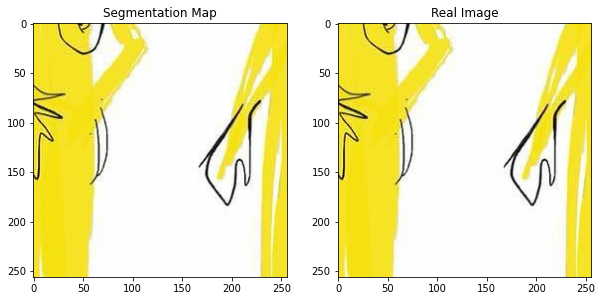

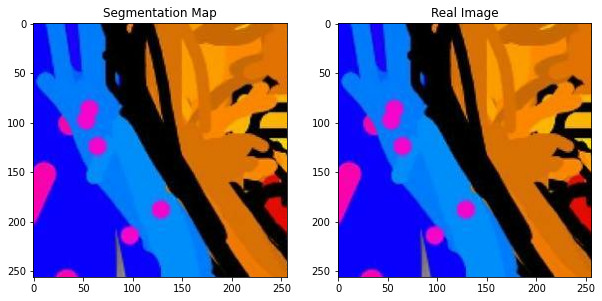

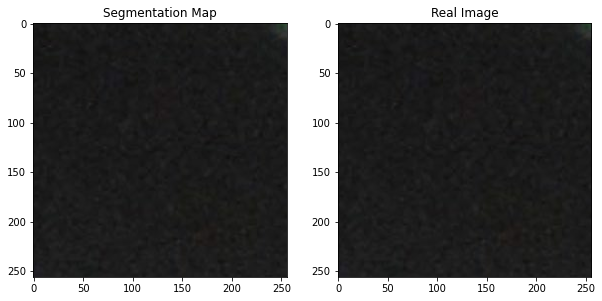

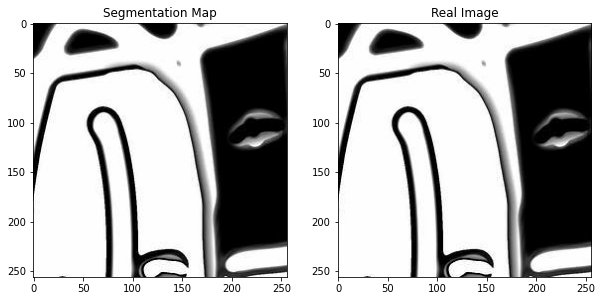

In [ ]:
sample_train_batch = next(iter(train_dataset))
print(f"Segmentation map batch shape: {sample_train_batch[0].shape}.")
print(f"Image batch shape: {sample_train_batch[1].shape}.")
print(f"One-hot encoded label map shape: {sample_train_batch[2].shape}.")

# Plot a view samples from the training set.
for segmentation_map, real_image in zip(sample_train_batch[0], sample_train_batch[1]):
    fig = plt.figure(figsize=(10, 10))
    fig.add_subplot(1, 2, 1).set_title("Segmentation Map")
    plt.imshow((segmentation_map + 1) / 2)
    fig.add_subplot(1, 2, 2).set_title("Real Image")
    plt.imshow((real_image + 1) / 2)
    plt.show()

In [ ]:
# implement the spade layer
class SPADE(layers.Layer):
    def __init__(self, filters, epsilon=1e-5, **kwargs):
        super().__init__(**kwargs)
        self.epsilon = epsilon
        self.conv = layers.Conv2D(128, 3, padding="same", activation="relu")
        self.conv_gamma = layers.Conv2D(filters, 3, padding="same")
        self.conv_beta = layers.Conv2D(filters, 3, padding="same")

    def build(self, input_shape):
        self.resize_shape = input_shape[1:3]

    def call(self, input_tensor, raw_mask):
        mask = tf.image.resize(raw_mask, self.resize_shape, method="nearest")
        x = self.conv(mask)
        gamma = self.conv_gamma(x)
        beta = self.conv_beta(x)
        mean, var = tf.nn.moments(input_tensor, axes=(0, 1, 2), keepdims=True)
        std = tf.sqrt(var + self.epsilon)
        normalized = (input_tensor - mean) / std
        output = gamma * normalized + beta
        return output

# implement the residual block including spade
class ResBlock(layers.Layer):
    def __init__(self, filters, **kwargs):
        super().__init__(**kwargs)
        self.filters = filters

    def build(self, input_shape):
        input_filter = input_shape[-1]
        self.spade_1 = SPADE(input_filter)
        self.spade_2 = SPADE(self.filters)
        self.conv_1 = layers.Conv2D(self.filters, 3, padding="same")
        self.conv_2 = layers.Conv2D(self.filters, 3, padding="same")
        self.learned_skip = False

        if self.filters != input_filter:
            self.learned_skip = True
            self.spade_3 = SPADE(input_filter)
            self.conv_3 = layers.Conv2D(self.filters, 3, padding="same")

    def call(self, input_tensor, mask):
        x = self.spade_1(input_tensor, mask)
        x = self.conv_1(tf.nn.leaky_relu(x, 0.2))
        x = self.spade_2(x, mask)
        x = self.conv_2(tf.nn.leaky_relu(x, 0.2))
        skip = (
            self.conv_3(tf.nn.leaky_relu(self.spade_3(input_tensor, mask), 0.2))
            if self.learned_skip
            else input_tensor
        )
        output = skip + x
        return output

# implement the gaussian sample
class GaussianSampler(layers.Layer):
    def __init__(self, batch_size, latent_dim, **kwargs):
        super().__init__(**kwargs)
        self.batch_size = batch_size
        self.latent_dim = latent_dim

    def call(self, inputs):
        means, variance = inputs
        epsilon = tf.random.normal(
            shape=(self.batch_size, self.latent_dim), mean=0.0, stddev=1.0
        )
        samples = means + tf.exp(0.5 * variance) * epsilon
        return samples

In [ ]:
# implement the downsampling block for the encoder
def downsample(
    channels,
    kernels,
    strides=2,
    apply_norm=True,
    apply_activation=True,
    apply_dropout=False,
):
    block = keras.Sequential()
    block.add(
        layers.Conv2D(
            channels,
            kernels,
            strides=strides,
            padding="same",
            use_bias=False,
            kernel_initializer=keras.initializers.GlorotNormal(),
        )
    )
    if apply_norm:
        block.add(tfa.layers.InstanceNormalization())
    if apply_activation:
        block.add(layers.LeakyReLU(0.2))
    if apply_dropout:
        block.add(layers.Dropout(0.5))
    return block

In [ ]:
# build a gaugan encoder with a few downsampling blocks
def build_encoder(image_shape, encoder_downsample_factor=64, latent_dim=256):
    input_image = keras.Input(shape=image_shape)
    x = downsample(encoder_downsample_factor, 3, apply_norm=False)(input_image)
    x = downsample(2 * encoder_downsample_factor, 3)(x)
    x = downsample(4 * encoder_downsample_factor, 3)(x)
    x = downsample(8 * encoder_downsample_factor, 3)(x)
    x = downsample(8 * encoder_downsample_factor, 3)(x)
    x = layers.Flatten()(x)
    mean = layers.Dense(latent_dim, name="mean")(x)
    variance = layers.Dense(latent_dim, name="variance")(x)
    return keras.Model(input_image, [mean, variance], name="encoder")

In [ ]:
# build a generator with modified residual blocks and upsampling blocks
def build_generator(mask_shape, latent_dim=256):
    latent = keras.Input(shape=(latent_dim))
    mask = keras.Input(shape=mask_shape)
    x = layers.Dense(16384)(latent)
    x = layers.Reshape((4, 4, 1024))(x)
    x = ResBlock(filters=1024)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = ResBlock(filters=1024)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = ResBlock(filters=1024)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = ResBlock(filters=512)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = ResBlock(filters=256)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = ResBlock(filters=128)(x, mask)
    x = layers.UpSampling2D((2, 2))(x)
    x = tf.nn.leaky_relu(x, 0.2)
    output_image = tf.nn.tanh(layers.Conv2D(3, 4, padding="same")(x))
    return keras.Model([latent, mask], output_image, name="generator")

In [ ]:
# build a discriminator which concatenate a segmentation map and an image
def build_discriminator(image_shape, downsample_factor=64):
    input_image_A = keras.Input(shape=image_shape, name="discriminator_image_A")
    input_image_B = keras.Input(shape=image_shape, name="discriminator_image_B")
    x = layers.Concatenate()([input_image_A, input_image_B])
    x1 = downsample(downsample_factor, 4, apply_norm=False)(x)
    x2 = downsample(2 * downsample_factor, 4)(x1)
    x3 = downsample(4 * downsample_factor, 4)(x2)
    x4 = downsample(8 * downsample_factor, 4, strides=1)(x3)
    x5 = layers.Conv2D(1, 4)(x4)
    outputs = [x1, x2, x3, x4, x5]
    return keras.Model([input_image_A, input_image_B], outputs)

In [ ]:
# loss functions
def generator_loss(y):
    return -tf.reduce_mean(y)

def kl_divergence_loss(mean, variance):
    return -0.5 * tf.reduce_sum(1 + variance - tf.square(mean) - tf.exp(variance))

class FeatureMatchingLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.mae = keras.losses.MeanAbsoluteError()

    def call(self, y_true, y_pred):
        loss = 0
        for i in range(len(y_true) - 1):
            loss += self.mae(y_true[i], y_pred[i])
        return loss

class VGGFeatureMatchingLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.encoder_layers = [
            "block1_conv1",
            "block2_conv1",
            "block3_conv1",
            "block4_conv1",
            "block5_conv1",
        ]
        self.weights = [1.0 / 32, 1.0 / 16, 1.0 / 8, 1.0 / 4, 1.0]
        vgg = keras.applications.VGG19(include_top=False, weights="imagenet")
        layer_outputs = [vgg.get_layer(x).output for x in self.encoder_layers]
        self.vgg_model = keras.Model(vgg.input, layer_outputs, name="VGG")
        self.mae = keras.losses.MeanAbsoluteError()

    def call(self, y_true, y_pred):
        y_true = keras.applications.vgg19.preprocess_input(127.5 * (y_true + 1))
        y_pred = keras.applications.vgg19.preprocess_input(127.5 * (y_pred + 1))
        real_features = self.vgg_model(y_true)
        fake_features = self.vgg_model(y_pred)
        loss = 0
        for i in range(len(real_features)):
            loss += self.weights[i] * self.mae(real_features[i], fake_features[i])
        return loss

class DiscriminatorLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.hinge_loss = keras.losses.Hinge()

    def call(self, y, is_real):
        label = 1.0 if is_real else -1.0
        return self.hinge_loss(label, y)

In [ ]:
# implement a callback to monitor the gaugan results while training
class GanMonitor(keras.callbacks.Callback):
    def __init__(self, n_samples, epoch_interval=5):
        self.val_images = next(iter(val_dataset))
        self.n_samples = n_samples
        self.epoch_interval = epoch_interval

    def infer(self):
        latent_vector = tf.random.normal(
            shape=(self.model.batch_size, self.model.latent_dim), mean=0.0, stddev=2.0
        )
        return self.model.predict([latent_vector, self.val_images[2]])

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.epoch_interval == 0:
            generated_images = self.infer()
            for _ in range(self.n_samples):
                grid_row = min(generated_images.shape[0], 3)
                f, axarr = plt.subplots(grid_row, 3, figsize=(18, grid_row * 6))
                for row in range(grid_row):
                    ax = axarr if grid_row == 1 else axarr[row]
                    ax[0].imshow((self.val_images[0][row] + 1) / 2)
                    ax[0].axis("off")
                    ax[0].set_title("Mask", fontsize=20)
                    ax[1].imshow((self.val_images[1][row] + 1) / 2)
                    ax[1].axis("off")
                    ax[1].set_title("Ground Truth", fontsize=20)
                    ax[2].imshow((generated_images[row] + 1) / 2)
                    ax[2].axis("off")
                    ax[2].set_title("Generated", fontsize=20)
                plt.show()

In [ ]:
# put everything together in a subclassed model
class GauGAN(keras.Model):
    def __init__(
        self,
        image_size,
        num_classes,
        batch_size,
        latent_dim,
        feature_loss_coeff=10,
        vgg_feature_loss_coeff=0.1,
        kl_divergence_loss_coeff=0.1,
        **kwargs,
    ):
        super().__init__(**kwargs)

        self.image_size = image_size
        self.latent_dim = latent_dim
        self.batch_size = batch_size
        self.num_classes = num_classes
        self.image_shape = (image_size, image_size, 3)
        self.mask_shape = (image_size, image_size, num_classes)
        self.feature_loss_coeff = feature_loss_coeff
        self.vgg_feature_loss_coeff = vgg_feature_loss_coeff
        self.kl_divergence_loss_coeff = kl_divergence_loss_coeff

        self.discriminator = build_discriminator(self.image_shape)
        self.generator = build_generator(self.mask_shape)
        self.encoder = build_encoder(self.image_shape)
        self.sampler = GaussianSampler(batch_size, latent_dim)
        self.patch_size, self.combined_model = self.build_combined_generator()

        self.disc_loss_tracker = tf.keras.metrics.Mean(name="disc_loss")
        self.gen_loss_tracker = tf.keras.metrics.Mean(name="gen_loss")
        self.feat_loss_tracker = tf.keras.metrics.Mean(name="feat_loss")
        self.vgg_loss_tracker = tf.keras.metrics.Mean(name="vgg_loss")
        self.kl_loss_tracker = tf.keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.disc_loss_tracker,
            self.gen_loss_tracker,
            self.feat_loss_tracker,
            self.vgg_loss_tracker,
            self.kl_loss_tracker,
        ]

    def build_combined_generator(self):
        # This method builds a model that takes as inputs the following:
        # latent vector, one-hot encoded segmentation label map, and
        # a segmentation map. It then (i) generates an image with the generator,
        # (ii) passes the generated images and segmentation map to the discriminator.
        # Finally, the model produces the following outputs: (a) discriminator outputs,
        # (b) generated image.
        # We will be using this model to simplify the implementation.
        self.discriminator.trainable = False
        mask_input = keras.Input(shape=self.mask_shape, name="mask")
        image_input = keras.Input(shape=self.image_shape, name="image")
        latent_input = keras.Input(shape=(self.latent_dim), name="latent")
        generated_image = self.generator([latent_input, mask_input])
        discriminator_output = self.discriminator([image_input, generated_image])
        patch_size = discriminator_output[-1].shape[1]
        combined_model = keras.Model(
            [latent_input, mask_input, image_input],
            [discriminator_output, generated_image],
        )
        return patch_size, combined_model

    def compile(self, gen_lr=1e-4, disc_lr=4e-4, **kwargs):
        super().compile(**kwargs)
        self.generator_optimizer = keras.optimizers.Adam(
            gen_lr, beta_1=0.0, beta_2=0.999
        )
        self.discriminator_optimizer = keras.optimizers.Adam(
            disc_lr, beta_1=0.0, beta_2=0.999
        )
        self.discriminator_loss = DiscriminatorLoss()
        self.feature_matching_loss = FeatureMatchingLoss()
        self.vgg_loss = VGGFeatureMatchingLoss()

    def train_discriminator(self, latent_vector, segmentation_map, real_image, labels):
        fake_images = self.generator([latent_vector, labels])
        with tf.GradientTape() as gradient_tape:
            pred_fake = self.discriminator([segmentation_map, fake_images])[-1]
            pred_real = self.discriminator([segmentation_map, real_image])[-1]
            loss_fake = self.discriminator_loss(pred_fake, False)
            loss_real = self.discriminator_loss(pred_real, True)
            total_loss = 0.5 * (loss_fake + loss_real)

        self.discriminator.trainable = True
        gradients = gradient_tape.gradient(
            total_loss, self.discriminator.trainable_variables
        )
        self.discriminator_optimizer.apply_gradients(
            zip(gradients, self.discriminator.trainable_variables)
        )
        return total_loss

    def train_generator(
        self, latent_vector, segmentation_map, labels, image, mean, variance
    ):
        # Generator learns through the signal provided by the discriminator. During
        # backpropagation, we only update the generator parameters.
        self.discriminator.trainable = False
        with tf.GradientTape() as tape:
            real_d_output = self.discriminator([segmentation_map, image])
            fake_d_output, fake_image = self.combined_model(
                [latent_vector, labels, segmentation_map]
            )
            pred = fake_d_output[-1]

            # Compute generator losses.
            g_loss = generator_loss(pred)
            kl_loss = self.kl_divergence_loss_coeff * kl_divergence_loss(mean, variance)
            vgg_loss = self.vgg_feature_loss_coeff * self.vgg_loss(image, fake_image)
            feature_loss = self.feature_loss_coeff * self.feature_matching_loss(
                real_d_output, fake_d_output
            )
            total_loss = g_loss + kl_loss + vgg_loss + feature_loss

        all_trainable_variables = (
            self.combined_model.trainable_variables + self.encoder.trainable_variables
        )

        gradients = tape.gradient(total_loss, all_trainable_variables)
        self.generator_optimizer.apply_gradients(
            zip(gradients, all_trainable_variables)
        )
        return total_loss, feature_loss, vgg_loss, kl_loss

    def train_step(self, data):
        segmentation_map, image, labels = data
        mean, variance = self.encoder(image)
        latent_vector = self.sampler([mean, variance])
        discriminator_loss = self.train_discriminator(
            latent_vector, segmentation_map, image, labels
        )
        (generator_loss, feature_loss, vgg_loss, kl_loss) = self.train_generator(
            latent_vector, segmentation_map, labels, image, mean, variance
        )

        # Report progress.
        self.disc_loss_tracker.update_state(discriminator_loss)
        self.gen_loss_tracker.update_state(generator_loss)
        self.feat_loss_tracker.update_state(feature_loss)
        self.vgg_loss_tracker.update_state(vgg_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        results = {m.name: m.result() for m in self.metrics}
        return results

    def test_step(self, data):
        segmentation_map, image, labels = data
        # Obtain the learned moments of the real image distribution.
        mean, variance = self.encoder(image)

        # Sample a latent from the distribution defined by the learned moments.
        latent_vector = self.sampler([mean, variance])

        # Generate the fake images.
        fake_images = self.generator([latent_vector, labels])

        # Calculate the losses.
        pred_fake = self.discriminator([segmentation_map, fake_images])[-1]
        pred_real = self.discriminator([segmentation_map, image])[-1]
        loss_fake = self.discriminator_loss(pred_fake, False)
        loss_real = self.discriminator_loss(pred_real, True)
        total_discriminator_loss = 0.5 * (loss_fake + loss_real)
        real_d_output = self.discriminator([segmentation_map, image])
        fake_d_output, fake_image = self.combined_model(
            [latent_vector, labels, segmentation_map]
        )
        pred = fake_d_output[-1]
        g_loss = generator_loss(pred)
        kl_loss = self.kl_divergence_loss_coeff * kl_divergence_loss(mean, variance)
        vgg_loss = self.vgg_feature_loss_coeff * self.vgg_loss(image, fake_image)
        feature_loss = self.feature_loss_coeff * self.feature_matching_loss(
            real_d_output, fake_d_output
        )
        total_generator_loss = g_loss + kl_loss + vgg_loss + feature_loss

        # Report progress.
        self.disc_loss_tracker.update_state(total_discriminator_loss)
        self.gen_loss_tracker.update_state(total_generator_loss)
        self.feat_loss_tracker.update_state(feature_loss)
        self.vgg_loss_tracker.update_state(vgg_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        results = {m.name: m.result() for m in self.metrics}
        return results

    def call(self, inputs):
        latent_vectors, labels = inputs
        return self.generator([latent_vectors, labels])

In [ ]:
# train gaugan
gaugan = GauGAN(IMG_HEIGHT, NUM_CLASSES, BATCH_SIZE, latent_dim=256)
gaugan.compile()

history = gaugan.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=15,
    callbacks=[GanMonitor(val_dataset, BATCH_SIZE)]
)

# plot history of training
def plot_history(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

plot_history("disc_loss")
plot_history("gen_loss")
plot_history("feat_loss")
plot_history("vgg_loss")
plot_history("kl_loss")

80150528/80134624 [==============================] - 0s 0us/step
Epoch 1/15
 42/200 [=====>........................] - ETA: 3:18:49 - disc_loss: 1.1921 - gen_loss: 118.0393 - feat_loss: 11.9098 - vgg_loss: 20.1387 - kl_loss: 85.7954

InvalidArgumentError: ignored

In [ ]:
# inference on validation set
val_iterator = iter(val_dataset)

for _ in range(5):
    val_images = next(val_iterator)
    # Sample latent from a normal distribution.
    latent_vector = tf.random.normal(
        shape=(gaugan.batch_size, gaugan.latent_dim), mean=0.0, stddev=2.0
    )
    # Generate fake images.
    fake_images = gaugan.predict([latent_vector, val_images[2]])

    real_images = val_images
    grid_row = min(fake_images.shape[0], 3)
    grid_col = 3
    f, axarr = plt.subplots(grid_row, grid_col, figsize=(grid_col * 6, grid_row * 6))
    for row in range(grid_row):
        ax = axarr if grid_row == 1 else axarr[row]
        ax[0].imshow((real_images[0][row] + 1) / 2)
        ax[0].axis("off")
        ax[0].set_title("Mask", fontsize=20)
        ax[1].imshow((real_images[1][row] + 1) / 2)
        ax[1].axis("off")
        ax[1].set_title("Ground Truth", fontsize=20)
        ax[2].imshow((fake_images[row] + 1) / 2)
        ax[2].axis("off")
        ax[2].set_title("Generated", fontsize=20)
    plt.show()

# StyleGAN

In [ ]:
def log2(x):
    return int(np.log2(x))


# we use different batch size for different resolution, so larger image size
# could fit into GPU memory. The keys is image resolution in log2
batch_sizes = {2: 16, 3: 16, 4: 16, 5: 16, 6: 16, 7: 8, 8: 4, 9: 2, 10: 1}
# We adjust the train step accordingly
train_step_ratio = {k: batch_sizes[2] / v for k, v in batch_sizes.items()}


# Create a dataset from our folder, and rescale the images to the [0-1] range:
ds_train = keras.preprocessing.image_dataset_from_directory(
    "drive/My Drive/opencampus/GANart for NFTs/datasets/camelia otero/", 
    label_mode=None, 
    image_size=(256, 256), 
    batch_size=32
)
ds_train = ds_train.map(lambda x: x / 255.0)

def resize_image(res, image):
    # only donwsampling, so use nearest neighbor that is faster to run
    image = tf.image.resize(
        image, (res, res), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
    )
    image = tf.cast(image, tf.float32) / 127.5 - 1.0
    return image

def create_dataloader(res):
    batch_size = batch_sizes[log2(res)]
    dl = ds_train.map(partial(resize_image, res), num_parallel_calls=tf.data.AUTOTUNE).unbatch()
    dl = dl.shuffle(200).batch(batch_size, drop_remainder=True).prefetch(1).repeat()
    return dl

Found 1000 files belonging to 1 classes.


In [ ]:
# display images after each epoch
def plot_images(images, log2_res, fname=""):
    scales = {2: 0.5, 3: 1, 4: 2, 5: 3, 6: 4, 7: 5, 8: 6, 9: 7, 10: 8}
    scale = scales[log2_res]

    grid_col = min(images.shape[0], int(32 // scale))
    grid_row = 1

    f, axarr = plt.subplots(
        grid_row, grid_col, figsize=(grid_col * scale, grid_row * scale)
    )

    for row in range(grid_row):
        ax = axarr if grid_row == 1 else axarr[row]
        for col in range(grid_col):
            ax[col].imshow(images[row * grid_col + col])
            ax[col].axis("off")
    plt.show()
    if fname:
        f.savefig(fname)

In [ ]:
# create custom layers 
def fade_in(alpha, a, b):
    return alpha * a + (1.0 - alpha) * b


def wasserstein_loss(y_true, y_pred):
    return -tf.reduce_mean(y_true * y_pred)


def pixel_norm(x, epsilon=1e-8):
    return x / tf.math.sqrt(tf.reduce_mean(x ** 2, axis=-1, keepdims=True) + epsilon)


def minibatch_std(input_tensor, epsilon=1e-8):
    n, h, w, c = tf.shape(input_tensor)
    group_size = tf.minimum(4, n)
    x = tf.reshape(input_tensor, [group_size, -1, h, w, c])
    group_mean, group_var = tf.nn.moments(x, axes=(0), keepdims=False)
    group_std = tf.sqrt(group_var + epsilon)
    avg_std = tf.reduce_mean(group_std, axis=[1, 2, 3], keepdims=True)
    x = tf.tile(avg_std, [group_size, h, w, 1])
    return tf.concat([input_tensor, x], axis=-1)


class EqualizedConv(layers.Layer):
    def __init__(self, out_channels, kernel=3, gain=2, **kwargs):
        super(EqualizedConv, self).__init__(**kwargs)
        self.kernel = kernel
        self.out_channels = out_channels
        self.gain = gain
        self.pad = kernel != 1

    def build(self, input_shape):
        self.in_channels = input_shape[-1]
        initializer = keras.initializers.RandomNormal(mean=0.0, stddev=1.0)
        self.w = self.add_weight(
            shape=[self.kernel, self.kernel, self.in_channels, self.out_channels],
            initializer=initializer,
            trainable=True,
            name="kernel",
        )
        self.b = self.add_weight(
            shape=(self.out_channels,), initializer="zeros", trainable=True, name="bias"
        )
        fan_in = self.kernel * self.kernel * self.in_channels
        self.scale = tf.sqrt(self.gain / fan_in)

    def call(self, inputs):
        if self.pad:
            x = tf.pad(inputs, [[0, 0], [1, 1], [1, 1], [0, 0]], mode="REFLECT")
        else:
            x = inputs
        output = (
            tf.nn.conv2d(x, self.scale * self.w, strides=1, padding="VALID") + self.b
        )
        return output


class EqualizedDense(layers.Layer):
    def __init__(self, units, gain=2, learning_rate_multiplier=1, **kwargs):
        super(EqualizedDense, self).__init__(**kwargs)
        self.units = units
        self.gain = gain
        self.learning_rate_multiplier = learning_rate_multiplier

    def build(self, input_shape):
        self.in_channels = input_shape[-1]
        initializer = keras.initializers.RandomNormal(
            mean=0.0, stddev=1.0 / self.learning_rate_multiplier
        )
        self.w = self.add_weight(
            shape=[self.in_channels, self.units],
            initializer=initializer,
            trainable=True,
            name="kernel",
        )
        self.b = self.add_weight(
            shape=(self.units,), initializer="zeros", trainable=True, name="bias"
        )
        fan_in = self.in_channels
        self.scale = tf.sqrt(self.gain / fan_in)

    def call(self, inputs):
        output = tf.add(tf.matmul(inputs, self.scale * self.w), self.b)
        return output * self.learning_rate_multiplier


class AddNoise(layers.Layer):
    def build(self, input_shape):
        n, h, w, c = input_shape[0]
        initializer = keras.initializers.RandomNormal(mean=0.0, stddev=1.0)
        self.b = self.add_weight(
            shape=[1, 1, 1, c], initializer=initializer, trainable=True, name="kernel"
        )

    def call(self, inputs):
        x, noise = inputs
        output = x + self.b * noise
        return output


class AdaIN(layers.Layer):
    def __init__(self, gain=1, **kwargs):
        super(AdaIN, self).__init__(**kwargs)
        self.gain = gain

    def build(self, input_shapes):
        x_shape = input_shapes[0]
        w_shape = input_shapes[1]

        self.w_channels = w_shape[-1]
        self.x_channels = x_shape[-1]

        self.dense_1 = EqualizedDense(self.x_channels, gain=1)
        self.dense_2 = EqualizedDense(self.x_channels, gain=1)

    def call(self, inputs):
        x, w = inputs
        ys = tf.reshape(self.dense_1(w), (-1, 1, 1, self.x_channels))
        yb = tf.reshape(self.dense_2(w), (-1, 1, 1, self.x_channels))
        return ys * x + yb

In [ ]:
# map the random noise into the model
def Mapping(num_stages, input_shape=512):
    z = layers.Input(shape=(input_shape))
    w = pixel_norm(z)
    for i in range(8):
        w = EqualizedDense(512, learning_rate_multiplier=0.01)(w)
        w = layers.LeakyReLU(0.2)(w)
    w = tf.tile(tf.expand_dims(w, 1), (1, num_stages, 1))
    return keras.Model(z, w, name="mapping")

# generator
class Generator:
    def __init__(self, start_res_log2, target_res_log2):
        self.start_res_log2 = start_res_log2
        self.target_res_log2 = target_res_log2
        self.num_stages = target_res_log2 - start_res_log2 + 1
        # list of generator blocks at increasing resolution
        self.g_blocks = []
        # list of layers to convert g_block activation to RGB
        self.to_rgb = []
        # list of noise input of different resolutions into g_blocks
        self.noise_inputs = []
        # filter size to use at each stage, keys are log2(resolution)
        self.filter_nums = {
            0: 512,
            1: 512,
            2: 512,  # 4x4
            3: 512,  # 8x8
            4: 512,  # 16x16
            5: 512,  # 32x32
            6: 256,  # 64x64
            7: 128,  # 128x128
            8: 64,  # 256x256
            9: 32,  # 512x512
            10: 16,
        }  # 1024x1024

        start_res = 2 ** start_res_log2
        self.input_shape = (start_res, start_res, self.filter_nums[start_res_log2])
        self.g_input = layers.Input(self.input_shape, name="generator_input")

        for i in range(start_res_log2, target_res_log2 + 1):
            filter_num = self.filter_nums[i]
            res = 2 ** i
            self.noise_inputs.append(
                layers.Input(shape=(res, res, 1), name=f"noise_{res}x{res}")
            )
            to_rgb = Sequential(
                [
                    layers.InputLayer(input_shape=(res, res, filter_num)),
                    EqualizedConv(3, 1, gain=1),
                ],
                name=f"to_rgb_{res}x{res}",
            )
            self.to_rgb.append(to_rgb)
            is_base = i == self.start_res_log2
            if is_base:
                input_shape = (res, res, self.filter_nums[i - 1])
            else:
                input_shape = (2 ** (i - 1), 2 ** (i - 1), self.filter_nums[i - 1])
            g_block = self.build_block(
                filter_num, res=res, input_shape=input_shape, is_base=is_base
            )
            self.g_blocks.append(g_block)

    def build_block(self, filter_num, res, input_shape, is_base):
        input_tensor = layers.Input(shape=input_shape, name=f"g_{res}")
        noise = layers.Input(shape=(res, res, 1), name=f"noise_{res}")
        w = layers.Input(shape=512)
        x = input_tensor

        if not is_base:
            x = layers.UpSampling2D((2, 2))(x)
            x = EqualizedConv(filter_num, 3)(x)

        x = AddNoise()([x, noise])
        x = layers.LeakyReLU(0.2)(x)
        x = InstanceNormalization()(x)
        x = AdaIN()([x, w])

        x = EqualizedConv(filter_num, 3)(x)
        x = AddNoise()([x, noise])
        x = layers.LeakyReLU(0.2)(x)
        x = InstanceNormalization()(x)
        x = AdaIN()([x, w])
        return keras.Model([input_tensor, w, noise], x, name=f"genblock_{res}x{res}")

    def grow(self, res_log2):
        res = 2 ** res_log2

        num_stages = res_log2 - self.start_res_log2 + 1
        w = layers.Input(shape=(self.num_stages, 512), name="w")

        alpha = layers.Input(shape=(1), name="g_alpha")
        x = self.g_blocks[0]([self.g_input, w[:, 0], self.noise_inputs[0]])

        if num_stages == 1:
            rgb = self.to_rgb[0](x)
        else:
            for i in range(1, num_stages - 1):

                x = self.g_blocks[i]([x, w[:, i], self.noise_inputs[i]])

            old_rgb = self.to_rgb[num_stages - 2](x)
            old_rgb = layers.UpSampling2D((2, 2))(old_rgb)

            i = num_stages - 1
            x = self.g_blocks[i]([x, w[:, i], self.noise_inputs[i]])

            new_rgb = self.to_rgb[i](x)

            rgb = fade_in(alpha[0], new_rgb, old_rgb)

        return keras.Model(
            [self.g_input, w, self.noise_inputs, alpha],
            rgb,
            name=f"generator_{res}_x_{res}",
        )

# the discriminator
class Discriminator:
    def __init__(self, start_res_log2, target_res_log2):
        self.start_res_log2 = start_res_log2
        self.target_res_log2 = target_res_log2
        self.num_stages = target_res_log2 - start_res_log2 + 1
        # filter size to use at each stage, keys are log2(resolution)
        self.filter_nums = {
            0: 512,
            1: 512,
            2: 512,  # 4x4
            3: 512,  # 8x8
            4: 512,  # 16x16
            5: 512,  # 32x32
            6: 256,  # 64x64
            7: 128,  # 128x128
            8: 64,  # 256x256
            9: 32,  # 512x512
            10: 16,
        }  # 1024x1024
        # list of discriminator blocks at increasing resolution
        self.d_blocks = []
        # list of layers to convert RGB into activation for d_blocks inputs
        self.from_rgb = []

        for res_log2 in range(self.start_res_log2, self.target_res_log2 + 1):
            res = 2 ** res_log2
            filter_num = self.filter_nums[res_log2]
            from_rgb = Sequential(
                [
                    layers.InputLayer(
                        input_shape=(res, res, 3), name=f"from_rgb_input_{res}"
                    ),
                    EqualizedConv(filter_num, 1),
                    layers.LeakyReLU(0.2),
                ],
                name=f"from_rgb_{res}",
            )

            self.from_rgb.append(from_rgb)

            input_shape = (res, res, filter_num)
            if len(self.d_blocks) == 0:
                d_block = self.build_base(filter_num, res)
            else:
                d_block = self.build_block(
                    filter_num, self.filter_nums[res_log2 - 1], res
                )

            self.d_blocks.append(d_block)

    def build_base(self, filter_num, res):
        input_tensor = layers.Input(shape=(res, res, filter_num), name=f"d_{res}")
        x = minibatch_std(input_tensor)
        x = EqualizedConv(filter_num, 3)(x)
        x = layers.LeakyReLU(0.2)(x)
        x = layers.Flatten()(x)
        x = EqualizedDense(filter_num)(x)
        x = layers.LeakyReLU(0.2)(x)
        x = EqualizedDense(1)(x)
        return keras.Model(input_tensor, x, name=f"d_{res}")

    def build_block(self, filter_num_1, filter_num_2, res):
        input_tensor = layers.Input(shape=(res, res, filter_num_1), name=f"d_{res}")
        x = EqualizedConv(filter_num_1, 3)(input_tensor)
        x = layers.LeakyReLU(0.2)(x)
        x = EqualizedConv(filter_num_2)(x)
        x = layers.LeakyReLU(0.2)(x)
        x = layers.AveragePooling2D((2, 2))(x)
        return keras.Model(input_tensor, x, name=f"d_{res}")

    def grow(self, res_log2):
        res = 2 ** res_log2
        idx = res_log2 - self.start_res_log2
        alpha = layers.Input(shape=(1), name="d_alpha")
        input_image = layers.Input(shape=(res, res, 3), name="input_image")
        x = self.from_rgb[idx](input_image)
        x = self.d_blocks[idx](x)
        if idx > 0:
            idx -= 1
            downsized_image = layers.AveragePooling2D((2, 2))(input_image)
            y = self.from_rgb[idx](downsized_image)
            x = fade_in(alpha[0], x, y)

            for i in range(idx, -1, -1):
                x = self.d_blocks[i](x)
        return keras.Model([input_image, alpha], x, name=f"discriminator_{res}_x_{res}")


In [ ]:
# build stylegan with custom train step
class StyleGAN(tf.keras.Model):
    def __init__(self, z_dim=512, target_res=64, start_res=4):
        super(StyleGAN, self).__init__()
        self.z_dim = z_dim

        self.target_res_log2 = log2(target_res)
        self.start_res_log2 = log2(start_res)
        self.current_res_log2 = self.target_res_log2
        self.num_stages = self.target_res_log2 - self.start_res_log2 + 1

        self.alpha = tf.Variable(1.0, dtype=tf.float32, trainable=False, name="alpha")

        self.mapping = Mapping(num_stages=self.num_stages)
        self.d_builder = Discriminator(self.start_res_log2, self.target_res_log2)
        self.g_builder = Generator(self.start_res_log2, self.target_res_log2)
        self.g_input_shape = self.g_builder.input_shape

        self.phase = None
        self.train_step_counter = tf.Variable(0, dtype=tf.int32, trainable=False)

        self.loss_weights = {"gradient_penalty": 10, "drift": 0.001}

    def grow_model(self, res):
        tf.keras.backend.clear_session()
        res_log2 = log2(res)
        self.generator = self.g_builder.grow(res_log2)
        self.discriminator = self.d_builder.grow(res_log2)
        self.current_res_log2 = res_log2
        print(f"\nModel resolution:{res}x{res}")

    def compile(
        self, steps_per_epoch, phase, res, d_optimizer, g_optimizer, *args, **kwargs
    ):
        self.loss_weights = kwargs.pop("loss_weights", self.loss_weights)
        self.steps_per_epoch = steps_per_epoch
        if res != 2 ** self.current_res_log2:
            self.grow_model(res)
            self.d_optimizer = d_optimizer
            self.g_optimizer = g_optimizer

        self.train_step_counter.assign(0)
        self.phase = phase
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")
        super(StyleGAN, self).compile(*args, **kwargs)

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def generate_noise(self, batch_size):
        noise = [
            tf.random.normal((batch_size, 2 ** res, 2 ** res, 1))
            for res in range(self.start_res_log2, self.target_res_log2 + 1)
        ]
        return noise

    def gradient_loss(self, grad):
        loss = tf.square(grad)
        loss = tf.reduce_sum(loss, axis=tf.range(1, tf.size(tf.shape(loss))))
        loss = tf.sqrt(loss)
        loss = tf.reduce_mean(tf.square(loss - 1))
        return loss

    def train_step(self, real_images):

        self.train_step_counter.assign_add(1)

        if self.phase == "TRANSITION":
            self.alpha.assign(
                tf.cast(self.train_step_counter / self.steps_per_epoch, tf.float32)
            )
        elif self.phase == "STABLE":
            self.alpha.assign(1.0)
        else:
            raise NotImplementedError
        alpha = tf.expand_dims(self.alpha, 0)
        batch_size = tf.shape(real_images)[0]
        real_labels = tf.ones(batch_size)
        fake_labels = -tf.ones(batch_size)

        z = tf.random.normal((batch_size, self.z_dim))
        const_input = tf.ones(tuple([batch_size] + list(self.g_input_shape)))
        noise = self.generate_noise(batch_size)

        # generator
        with tf.GradientTape() as g_tape:
            w = self.mapping(z)
            fake_images = self.generator([const_input, w, noise, alpha])
            pred_fake = self.discriminator([fake_images, alpha])
            g_loss = wasserstein_loss(real_labels, pred_fake)

            trainable_weights = (
                self.mapping.trainable_weights + self.generator.trainable_weights
            )
            gradients = g_tape.gradient(g_loss, trainable_weights)
            self.g_optimizer.apply_gradients(zip(gradients, trainable_weights))

        # discriminator
        with tf.GradientTape() as gradient_tape, tf.GradientTape() as total_tape:
            # forward pass
            pred_fake = self.discriminator([fake_images, alpha])
            pred_real = self.discriminator([real_images, alpha])

            epsilon = tf.random.uniform((batch_size, 1, 1, 1))
            interpolates = epsilon * real_images + (1 - epsilon) * fake_images
            gradient_tape.watch(interpolates)
            pred_fake_grad = self.discriminator([interpolates, alpha])

            # calculate losses
            loss_fake = wasserstein_loss(fake_labels, pred_fake)
            loss_real = wasserstein_loss(real_labels, pred_real)
            loss_fake_grad = wasserstein_loss(fake_labels, pred_fake_grad)

            # gradient penalty
            gradients_fake = gradient_tape.gradient(loss_fake_grad, [interpolates])
            gradient_penalty = self.loss_weights[
                "gradient_penalty"
            ] * self.gradient_loss(gradients_fake)

            # drift loss
            all_pred = tf.concat([pred_fake, pred_real], axis=0)
            drift_loss = self.loss_weights["drift"] * tf.reduce_mean(all_pred ** 2)

            d_loss = loss_fake + loss_real + gradient_penalty + drift_loss

            gradients = total_tape.gradient(
                d_loss, self.discriminator.trainable_weights
            )
            self.d_optimizer.apply_gradients(
                zip(gradients, self.discriminator.trainable_weights)
            )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

    def call(self, inputs: dict()):
        style_code = inputs.get("style_code", None)
        z = inputs.get("z", None)
        noise = inputs.get("noise", None)
        batch_size = inputs.get("batch_size", 1)
        alpha = inputs.get("alpha", 1.0)
        alpha = tf.expand_dims(alpha, 0)
        if style_code is None:
            if z is None:
                z = tf.random.normal((batch_size, self.z_dim))
            style_code = self.mapping(z)

        if noise is None:
            noise = self.generate_noise(batch_size)

        # self.alpha.assign(alpha)

        const_input = tf.ones(tuple([batch_size] + list(self.g_input_shape)))
        images = self.generator([const_input, style_code, noise, alpha])
        images = np.clip((images * 0.5 + 0.5) * 255, 0, 255).astype(np.uint8)

        return images


In [ ]:
START_RES = 4
TARGET_RES = 128

# first train with smaller definition
style_gan = StyleGAN(start_res=START_RES, target_res=TARGET_RES)

In [ ]:
# train the model with progressive growing
def train(
    start_res=START_RES,
    target_res=TARGET_RES,
    steps_per_epoch=5000,
    display_images=True,
):
    opt_cfg = {"learning_rate": 1e-3, "beta_1": 0.0, "beta_2": 0.99, "epsilon": 1e-8}

    val_batch_size = 16
    val_z = tf.random.normal((val_batch_size, style_gan.z_dim))
    val_noise = style_gan.generate_noise(val_batch_size)

    start_res_log2 = int(np.log2(start_res))
    target_res_log2 = int(np.log2(target_res))

    for res_log2 in range(start_res_log2, target_res_log2 + 1):
        res = 2 ** res_log2
        for phase in ["TRANSITION", "STABLE"]:
            if res == start_res and phase == "TRANSITION":
                continue

            train_dl = create_dataloader(res)

            steps = int(train_step_ratio[res_log2] * steps_per_epoch)

            style_gan.compile(
                d_optimizer=tf.keras.optimizers.Adam(**opt_cfg),
                g_optimizer=tf.keras.optimizers.Adam(**opt_cfg),
                loss_weights={"gradient_penalty": 10, "drift": 0.001},
                steps_per_epoch=steps,
                res=res,
                phase=phase,
                run_eagerly=False,
            )

            prefix = f"res_{res}x{res}_{style_gan.phase}"

            ckpt_cb = keras.callbacks.ModelCheckpoint(
                f"checkpoints/stylegan_{res}x{res}.ckpt",
                save_weights_only=True,
                verbose=0,
            )
            print(phase)
            style_gan.fit(
                train_dl, epochs=1, steps_per_epoch=steps, callbacks=[ckpt_cb]
            )

            if display_images:
                images = style_gan({"z": val_z, "noise": val_noise, "alpha": 1.0})
                plot_images(images, res_log2)


Model resolution:4x4
STABLE
1/1 [==============================] - 13s 13s/step - d_loss: 1.1883 - g_loss: 3.2005


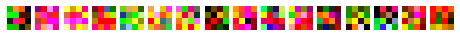


Model resolution:8x8
TRANSITION
1/1 [==============================] - 19s 19s/step - d_loss: 5.1273 - g_loss: 3.2624


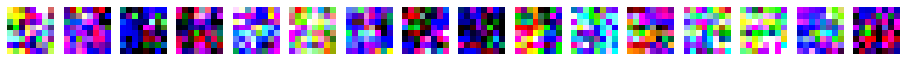

STABLE
1/1 [==============================] - 18s 18s/step - d_loss: 1.0332 - g_loss: 4.9134


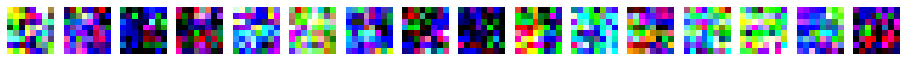


Model resolution:16x16
TRANSITION
1/1 [==============================] - 36s 36s/step - d_loss: 5.9851 - g_loss: 6.0545


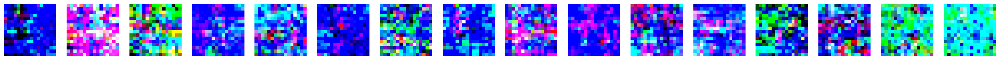

STABLE
1/1 [==============================] - 33s 33s/step - d_loss: -2.5033 - g_loss: 11.7969


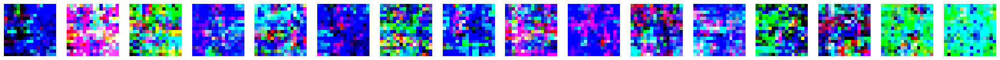


Model resolution:32x32
TRANSITION
1/1 [==============================] - 87s 87s/step - d_loss: -4.1242 - g_loss: 26.5072


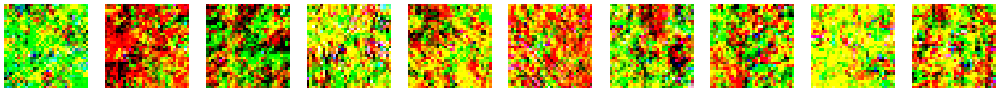

STABLE
1/1 [==============================] - 84s 84s/step - d_loss: -19.9974 - g_loss: 42.3261


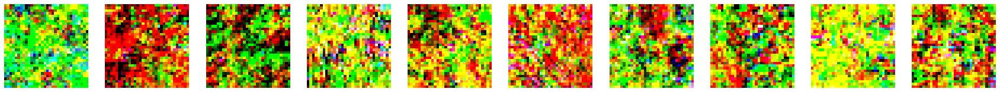


Model resolution:64x64
TRANSITION
1/1 [==============================] - 161s 161s/step - d_loss: -1.5725 - g_loss: 30.7445


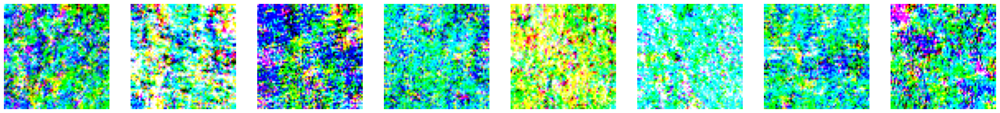

STABLE
1/1 [==============================] - 157s 157s/step - d_loss: -23.2781 - g_loss: 44.9215


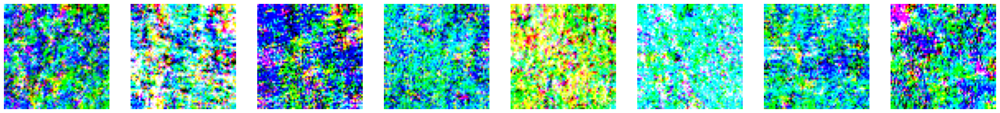


Model resolution:128x128
TRANSITION
2/2 [==============================] - 244s 112s/step - d_loss: -13.6190 - g_loss: 55.1896


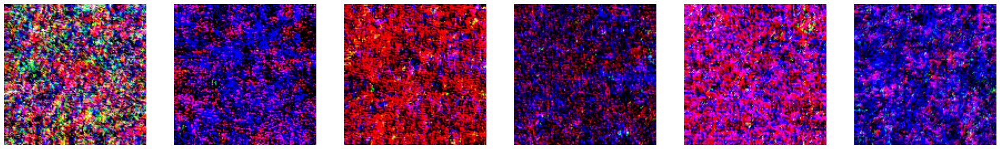

STABLE
2/2 [==============================] - 241s 113s/step - d_loss: -105.1938 - g_loss: 173.2834


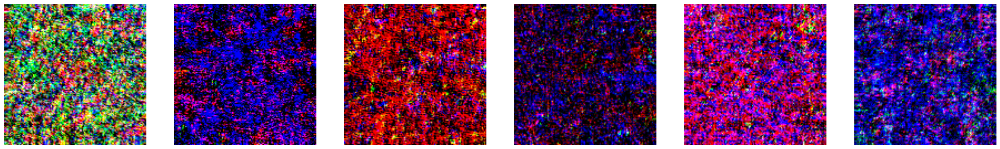

In [ ]:
# train 
train(start_res=4, target_res=128, steps_per_epoch=1, display_images=True)

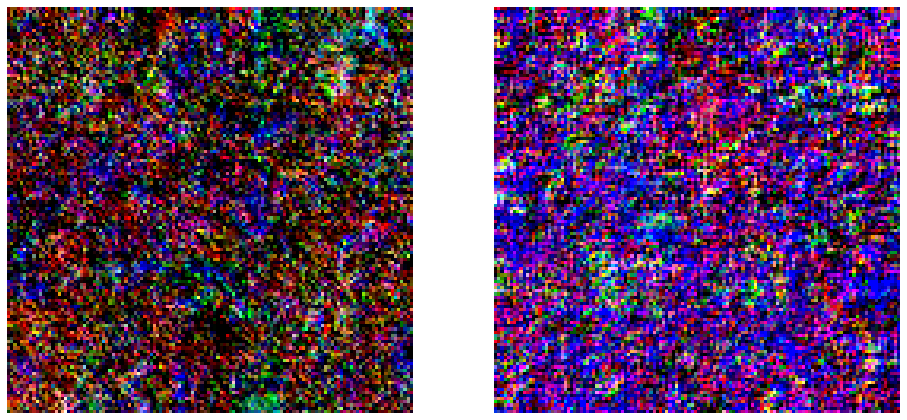

In [ ]:
# run some inferences to generate images
batch_size = 2
z = tf.random.normal((batch_size, style_gan.z_dim))
w = style_gan.mapping(z)
noise = style_gan.generate_noise(batch_size=batch_size)
images = style_gan({"style_code": w, "noise": noise, "alpha": 1.0})
plot_images(images, 10)

(-0.5, 383.5, 127.5, -0.5)

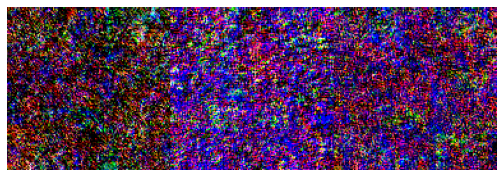

In [ ]:
alpha = 0.4
w_mix = np.expand_dims(alpha * w[0] + (1 - alpha) * w[1], 0)
noise_a = [np.expand_dims(n[0], 0) for n in noise]
mix_images = style_gan({"style_code": w_mix, "noise": noise_a})
image_row = np.hstack([images[0], images[1], mix_images[0]])
plt.figure(figsize=(9, 3))
plt.imshow(image_row)
plt.axis("off")